# Kmeans By Abdullah Hadi // 1301183430

# Import Library and Data

## Import Library

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import time

## Data description and objectives from readme
Tugas untuk unsupervised learning adalah memprediksi apakah pelanggan tertarik untuk membeli kendaraan baru atau tidak berdasarkan data pelanggan di dealer.

Description of every column:
- SIM	--> 0 : Tidak punya SIM 1 : Punya SIM
- Kode_Daerah --> Kode area tempat tinggal pelanggan
- Sudah_Asuransi --> 1 : Pelanggan sudah memiliki asuransi kendaraan, 0 : Pelanggan belum memiliki asuransi kendaraan
- Umur_Kendaraan --> Umur kendaraan
- Kendaraan_Rusak --> 1 : Kendaraan pernah rusak sebelumnya. 0 : Kendaraan belum pernah rusak.
- Premi --> Jumlah premi yang harus dibayarkan per tahun.
- Kanal_Penjualan --> Kode kanal untuk menghubungi pelanggan (email, telpon, dll)
- Lama_Berlangganan	--> Sudah berapa lama pelanggan menjadi klien perusahaan
- Tertarik --> 1 : Pelanggan tertarik, 0 : Pelanggan tidak tertarik


## Import Data from my github repo

they are two data, but we are allowed to use only the train data so we will use that

In [2]:
train_data = pd.read_csv("https://raw.githubusercontent.com/sir-hadi/Clustering-from-scratch/main/kendaraan/kendaraan_train.csv")
test_data = pd.read_csv("https://raw.githubusercontent.com/sir-hadi/Clustering-from-scratch/main/kendaraan/kendaraan_test.csv")

In [3]:
test_data

,Jenis_Kelamin,Umur,SIM,Kode_Daerah,Sudah_Asuransi,Umur_Kendaraan,Kendaraan_Rusak,Premi,Kanal_Penjualan,Lama_Berlangganan,Tertarik
0,Wanita,49,1,8,0,1-2 Tahun,Pernah,46963,26,145,0
1,Pria,22,1,47,1,< 1 Tahun,Tidak,39624,152,241,0
2,Pria,24,1,28,1,< 1 Tahun,Tidak,110479,152,62,0
3,Pria,46,1,8,1,1-2 Tahun,Tidak,36266,124,34,0
4,Pria,35,1,23,0,1-2 Tahun,Pernah,26963,152,229,0
...,...,...,...,...,...,...,...,...,...,...,...
47634,Pria,61,1,46,0,> 2 Tahun,Pernah,31039,124,67,0
47635,Pria,41,1,15,0,1-2 Tahun,Pernah,2630,157,232,0
47636,Pria,24,1,29,1,< 1 Tahun,Tidak,33101,152,211,0
47637,Pria,59,1,30,0,1-2 Tahun,Pernah,37788,26,239,1


In [4]:
train_data

,id,Jenis_Kelamin,Umur,SIM,Kode_Daerah,Sudah_Asuransi,Umur_Kendaraan,Kendaraan_Rusak,Premi,Kanal_Penjualan,Lama_Berlangganan,Tertarik
0,1,Wanita,30.0,1.0,33.0,1.0,< 1 Tahun,Tidak,28029.0,152.0,97.0,0
1,2,Pria,48.0,1.0,39.0,0.0,> 2 Tahun,Pernah,25800.0,29.0,158.0,0
2,3,NaN,21.0,1.0,46.0,1.0,< 1 Tahun,Tidak,32733.0,160.0,119.0,0
3,4,Wanita,58.0,1.0,48.0,0.0,1-2 Tahun,Tidak,2630.0,124.0,63.0,0
4,5,Pria,50.0,1.0,35.0,0.0,> 2 Tahun,NaN,34857.0,88.0,194.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
285826,285827,Wanita,23.0,1.0,4.0,1.0,< 1 Tahun,Tidak,25988.0,152.0,217.0,0
285827,285828,Wanita,21.0,1.0,46.0,1.0,< 1 Tahun,Tidak,44686.0,152.0,50.0,0
285828,285829,Wanita,23.0,1.0,50.0,1.0,< 1 Tahun,Tidak,49751.0,152.0,226.0,0
285829,285830,Pria,68.0,1.0,7.0,1.0,1-2 Tahun,Tidak,30503.0,124.0,270.0,0


# Data Cleaning, Data Analysis , Preproccesing

## Data Cleaning

Droping id in dataset

In [5]:
data = train_data.drop(['id'],axis=1)
data

,Jenis_Kelamin,Umur,SIM,Kode_Daerah,Sudah_Asuransi,Umur_Kendaraan,Kendaraan_Rusak,Premi,Kanal_Penjualan,Lama_Berlangganan,Tertarik
0,Wanita,30.0,1.0,33.0,1.0,< 1 Tahun,Tidak,28029.0,152.0,97.0,0
1,Pria,48.0,1.0,39.0,0.0,> 2 Tahun,Pernah,25800.0,29.0,158.0,0
2,NaN,21.0,1.0,46.0,1.0,< 1 Tahun,Tidak,32733.0,160.0,119.0,0
3,Wanita,58.0,1.0,48.0,0.0,1-2 Tahun,Tidak,2630.0,124.0,63.0,0
4,Pria,50.0,1.0,35.0,0.0,> 2 Tahun,NaN,34857.0,88.0,194.0,0
...,...,...,...,...,...,...,...,...,...,...,...
285826,Wanita,23.0,1.0,4.0,1.0,< 1 Tahun,Tidak,25988.0,152.0,217.0,0
285827,Wanita,21.0,1.0,46.0,1.0,< 1 Tahun,Tidak,44686.0,152.0,50.0,0
285828,Wanita,23.0,1.0,50.0,1.0,< 1 Tahun,Tidak,49751.0,152.0,226.0,0
285829,Pria,68.0,1.0,7.0,1.0,1-2 Tahun,Tidak,30503.0,124.0,270.0,0


Calculate how many NaN/Null data we have

In [6]:
data.isna().sum()

Jenis_Kelamin        14440
Umur                 14214
SIM                  14404
Kode_Daerah          14306
Sudah_Asuransi       14229
Umur_Kendaraan       14275
Kendaraan_Rusak      14188
Premi                14569
Kanal_Penjualan      14299
Lama_Berlangganan    13992
Tertarik                 0
dtype: int64

### Droping NaN Data
Since our data is massive, dropping 14k of data will not prove much impact
so we are gonna drop/remove them

In [7]:
print('Data Size Before :',data.shape[0])
data.dropna(inplace=True)
print('Data Size After :',data.shape[0])
data.isna().sum()

Data Size Before : 285831
Data Size After : 171068


Jenis_Kelamin        0
Umur                 0
SIM                  0
Kode_Daerah          0
Sudah_Asuransi       0
Umur_Kendaraan       0
Kendaraan_Rusak      0
Premi                0
Kanal_Penjualan      0
Lama_Berlangganan    0
Tertarik             0
dtype: int64

Droping duplicate data if there is any

In [8]:
data.drop_duplicates(inplace=True)
print('Data Size :',data.shape[0])

Data Size : 171017


## Data Analsyt for Cleaning and Preprocessing

Getting to know our data using describe function on pandas for some statistics infromation

In [9]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Umur,171017.0,38.818667,15.532358,20.0,25.0,36.0,49.0,85.0
SIM,171017.0,0.997930,0.045450,0.0,1.0,1.0,1.0,1.0
Kode_Daerah,171017.0,26.411298,13.262164,0.0,15.0,28.0,35.0,52.0
Sudah_Asuransi,171017.0,0.459791,0.498382,0.0,0.0,0.0,1.0,1.0
Premi,171017.0,30515.060573,17086.175432,2630.0,24376.0,31607.0,39328.0,540165.0
Kanal_Penjualan,171017.0,112.256700,54.108259,1.0,29.0,140.0,152.0,163.0
Lama_Berlangganan,171017.0,154.249876,83.862904,10.0,81.0,154.0,227.0,299.0
Tertarik,171017.0,0.121596,0.326820,0.0,0.0,0.0,0.0,1.0


### Plot data with float/number type on boxplot to gain more info on data

It appears that there are outliers in the Premi data

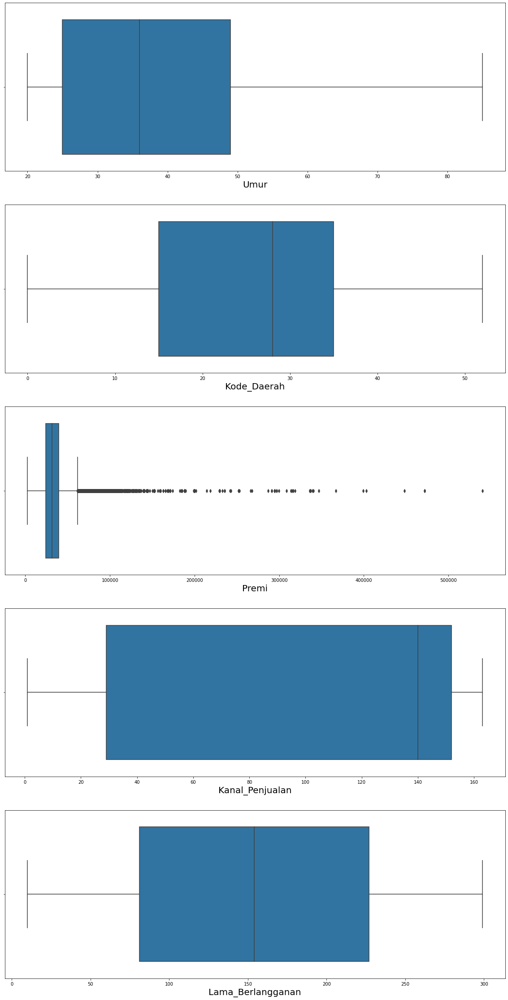

In [10]:
col = data.select_dtypes('float64').drop(['SIM','Sudah_Asuransi'],axis=1).columns

ncols = 1
nrows = len(col)
fig, axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(20,nrows*8))
axes = axes.ravel()

for i in range(len(col)) :
  sns.boxplot(x=data[col[i]],ax=axes[i])
  axes[i].set_xlabel(col[i], fontsize = 20)

plt.show()

Premi are limited to a maximum value of only 60k so that there are no outliers

Data Shape (165584, 11)


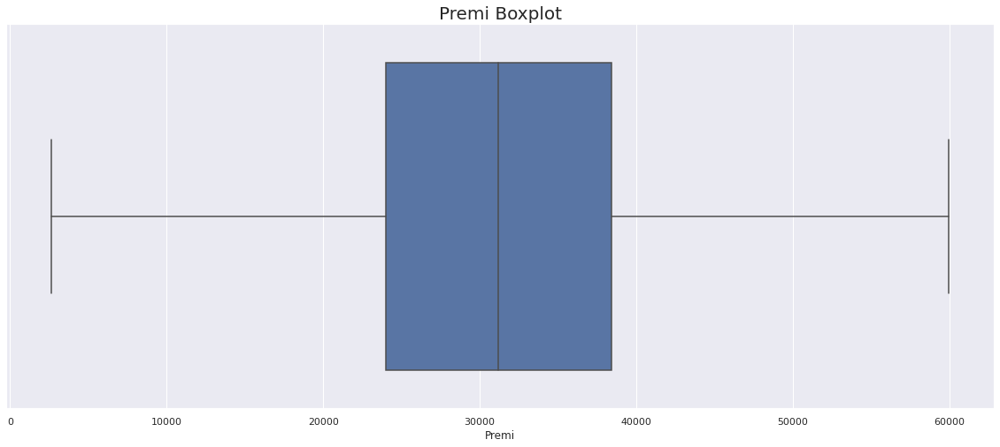

In [11]:
sns.set(rc={'figure.figsize':(20,8)})
clean_data = data.loc[data['Premi'] < 60000.0 ].copy()
print('Data Shape',clean_data.shape)
plt.title('Premi Boxplot',fontdict={'size':20})
sns.boxplot(x=clean_data['Premi'])
plt.show()

### Each data is plotted in the form of a histogram

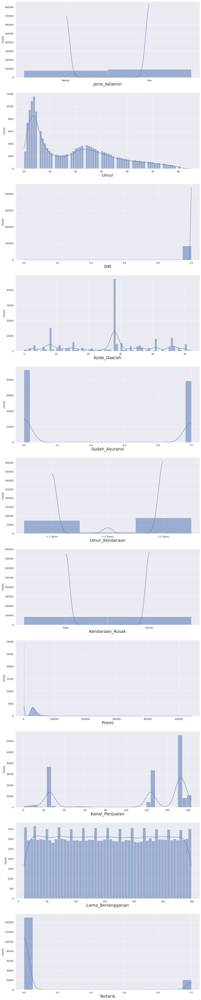

In [12]:
col = clean_data.columns

ncols = 1
nrows = len(col)
fig, axes = plt.subplots(nrows=nrows,ncols=ncols,figsize=(16,nrows*8))
axes = axes.ravel()

for i in range(len(col)) :
  sns.histplot(x=data[col[i]],ax=axes[i],kde=True)
  axes[i].set_xlabel(col[i], fontsize = 20)

plt.show()

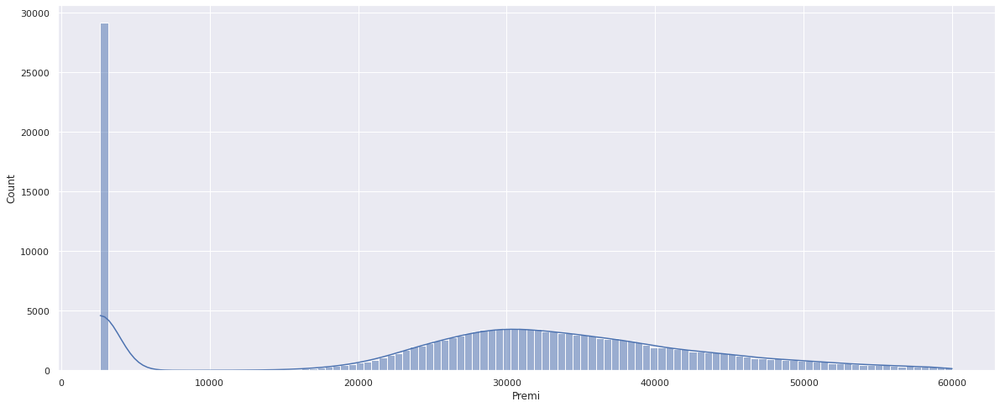

In [13]:
sns.histplot(clean_data['Premi'],kde=True)
plt.show()

Remove weird outliers on Premi data

Data Shape (136433, 11)


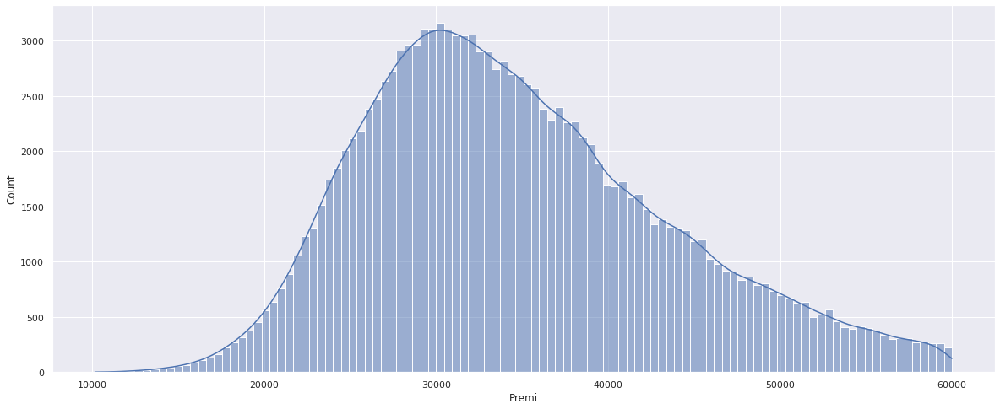

In [14]:
sns.set(rc={'figure.figsize':(20,8)})
clean_data2 = clean_data.loc[clean_data['Premi'] > 10000]
sns.histplot(clean_data2['Premi'],kde=True)
print('Data Shape',clean_data2.shape)
plt.show()

### Plot some data is in the form of a scatterplot

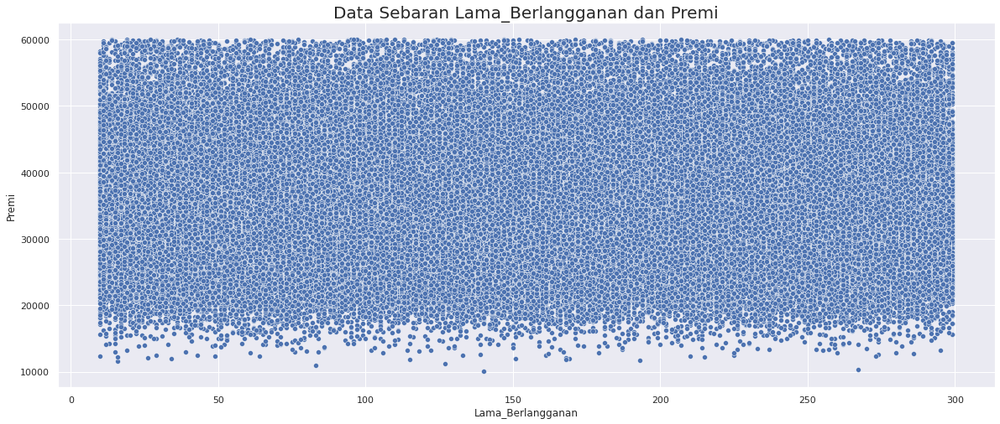

In [15]:
sns.scatterplot(x=clean_data2['Lama_Berlangganan'],y=clean_data2['Premi'])
plt.title('Data Sebaran Lama_Berlangganan dan Premi',fontdict={'size':20})
plt.show()

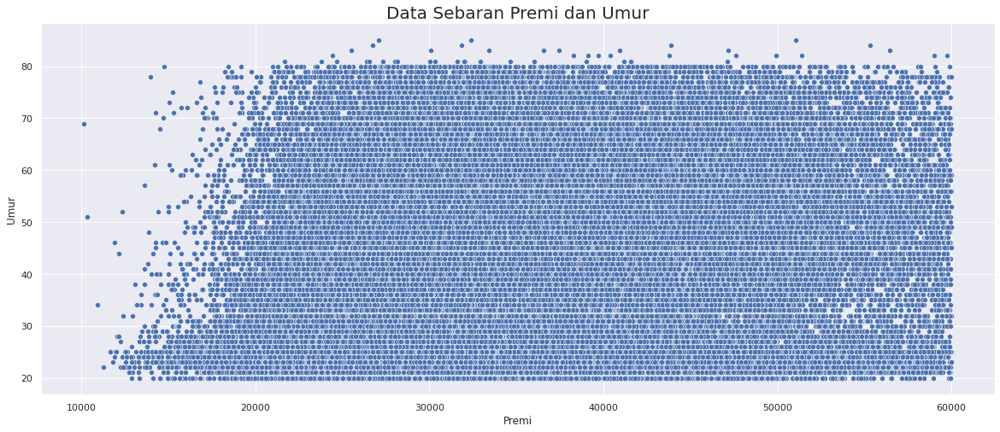

In [16]:
sns.scatterplot(x=clean_data2['Premi'],y=clean_data2['Umur'])
plt.title('Data Sebaran Premi dan Umur',fontdict={'size':20})
plt.show()

### Using Heatmap to find corralation

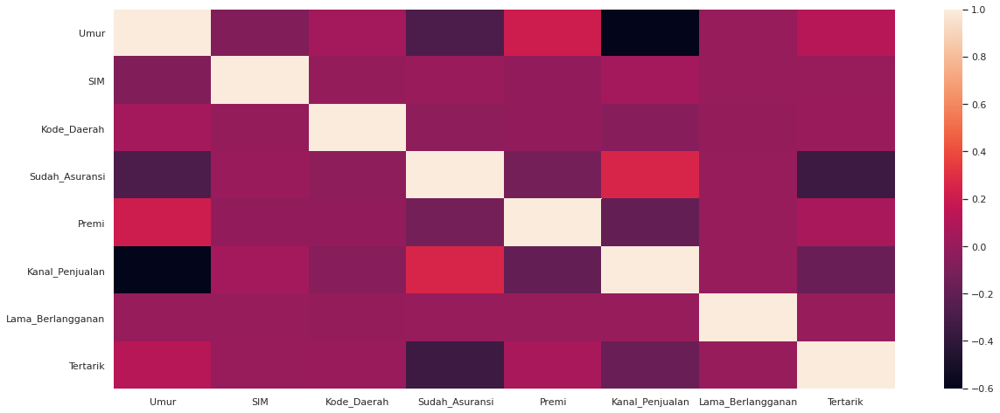

In [17]:
sns.heatmap(clean_data2.corr())

In [18]:
print(data.shape)
print(clean_data2.shape)

(171017, 11)
(136433, 11)


## Preprocessing Data

### Encode Non Numerical Value (kinda optional)

In [19]:
clean_encoded_data = clean_data2.copy()
clean_encoded_data['Jenis_Kelamin'] = clean_encoded_data['Jenis_Kelamin'].apply(lambda x: 0 if x == 'Pria' else 1)

In [20]:
tahuns = {'< 1 Tahun' : 0,
          '1-2 Tahun' : 1,
          '> 2 Tahun' : 2 }

tahuns['< 1 Tahun']
clean_encoded_data['Umur_Kendaraan'] = clean_encoded_data['Umur_Kendaraan'].apply(lambda x: tahuns[x])

In [21]:
clean_encoded_data['Kendaraan_Rusak'] = clean_encoded_data['Kendaraan_Rusak'].apply(lambda x: 0 if x == 'Tidak' else 1)

In [22]:
clean_encoded_data

,Jenis_Kelamin,Umur,SIM,Kode_Daerah,Sudah_Asuransi,Umur_Kendaraan,Kendaraan_Rusak,Premi,Kanal_Penjualan,Lama_Berlangganan,Tertarik
0,1,30.0,1.0,33.0,1.0,0,0,28029.0,152.0,97.0,0
1,0,48.0,1.0,39.0,0.0,2,1,25800.0,29.0,158.0,0
5,0,21.0,1.0,35.0,1.0,0,0,22735.0,152.0,171.0,0
8,1,20.0,1.0,8.0,1.0,0,0,30786.0,160.0,31.0,0
10,0,25.0,1.0,14.0,1.0,0,0,34212.0,152.0,282.0,0
...,...,...,...,...,...,...,...,...,...,...,...
285826,1,23.0,1.0,4.0,1.0,0,0,25988.0,152.0,217.0,0
285827,1,21.0,1.0,46.0,1.0,0,0,44686.0,152.0,50.0,0
285828,1,23.0,1.0,50.0,1.0,0,0,49751.0,152.0,226.0,0
285829,0,68.0,1.0,7.0,1.0,1,0,30503.0,124.0,270.0,0


### Min Max Scaller

In [23]:
pre_clean_encoded_data = clean_encoded_data.copy()

In [24]:
def minmax(data):
  min_val = data.min()
  max_val = data.max()
  return data.apply(lambda x: (x - min_val) / (max_val - min_val))

In [25]:
pre_clean_encoded_data['Premi'] = minmax(pre_clean_encoded_data['Premi'])
pre_clean_encoded_data['Lama_Berlangganan'] = minmax(pre_clean_encoded_data['Lama_Berlangganan'])
pre_clean_encoded_data['Umur'] = minmax(pre_clean_encoded_data['Umur'])

In [26]:
pre_clean_encoded_data

,Jenis_Kelamin,Umur,SIM,Kode_Daerah,Sudah_Asuransi,Umur_Kendaraan,Kendaraan_Rusak,Premi,Kanal_Penjualan,Lama_Berlangganan,Tertarik
0,1,0.153846,1.0,33.0,1.0,0,0,0.358718,152.0,0.301038,0
1,0,0.430769,1.0,39.0,0.0,2,1,0.314001,29.0,0.512111,0
5,0,0.015385,1.0,35.0,1.0,0,0,0.252513,152.0,0.557093,0
8,1,0.000000,1.0,8.0,1.0,0,0,0.414027,160.0,0.072664,0
10,0,0.076923,1.0,14.0,1.0,0,0,0.482757,152.0,0.941176,0
...,...,...,...,...,...,...,...,...,...,...,...
285826,1,0.046154,1.0,4.0,1.0,0,0,0.317772,152.0,0.716263,0
285827,1,0.015385,1.0,46.0,1.0,0,0,0.692880,152.0,0.138408,0
285828,1,0.046154,1.0,50.0,1.0,0,0,0.794491,152.0,0.747405,0
285829,0,0.738462,1.0,7.0,1.0,1,0,0.408350,124.0,0.899654,0


### Melihat Sebaran Data setelah di preprocessing

Data Sebaran Lama_Berlangganan dan Premi

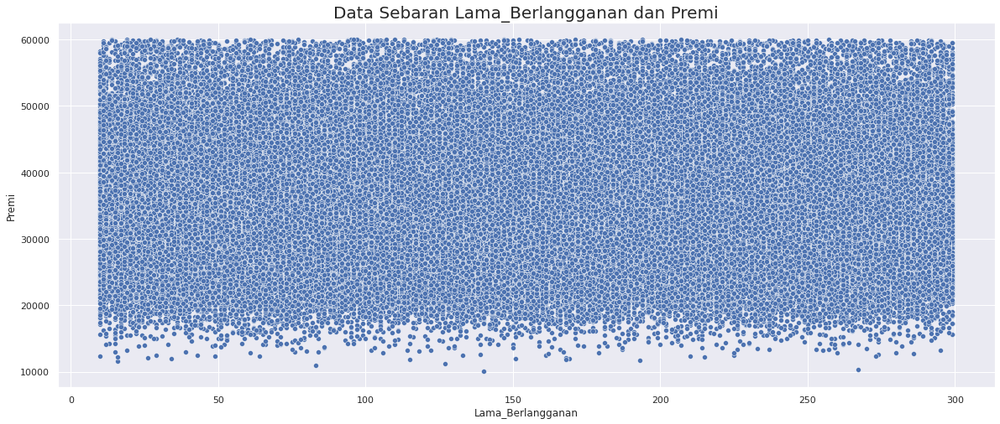

In [27]:
sns.scatterplot(x=clean_data2['Lama_Berlangganan'],y=clean_data2['Premi'])
plt.title('Data Sebaran Lama_Berlangganan dan Premi',fontdict={'size':20})
plt.show()

Data Sebaran Premi dan Umur

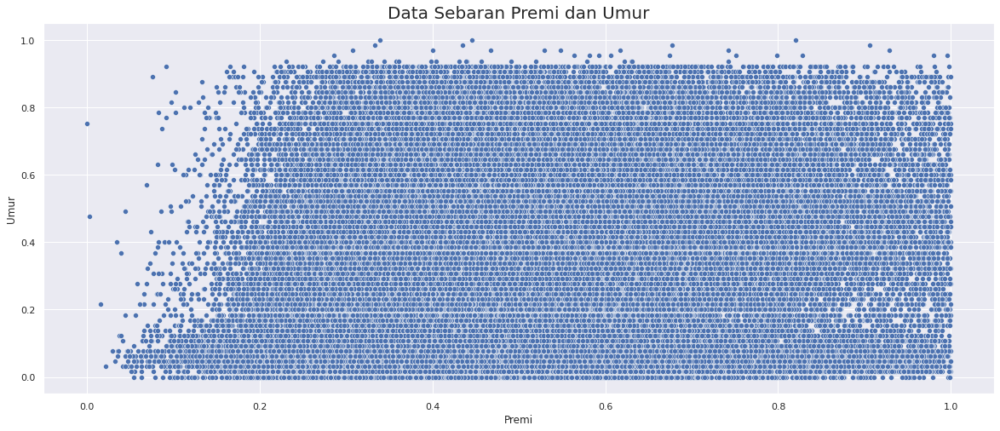

In [28]:
sns.scatterplot(x=pre_clean_encoded_data['Premi'],y=pre_clean_encoded_data['Umur'])
plt.title('Data Sebaran Premi dan Umur',fontdict={'size':20})
plt.show()

### Data Declaration to be used

In [29]:
X1 = pre_clean_encoded_data[['Lama_Berlangganan','Premi']].copy()
X2 = pre_clean_encoded_data[['Premi','Umur']].copy()

# Getting Random Centroid Using Function

In [30]:
def init_random_centroids(X, K):
  rand = (np.random.randint(0,X.shape[0]-1, K))
  centroids = X.iloc[rand, :]
  return centroids

In [31]:
centroid = init_random_centroids(X1,4)
centroid

,Lama_Berlangganan,Premi
70617,0.858131,0.602062
252925,0.110727,0.448813
73153,0.352941,0.491985
229460,0.297578,0.174253


# Calculating to find the nearest centroid + Euclidean Distance



In [32]:
def euclidean_distance(a,b):
  return np.sqrt(np.sum((a - b)**2, axis=1))

In [33]:
def find_closest_centroid_of(X,centroids):
  # Create a empty numpy matrix array fill with zero, 
  # with row as many as the data and column as many as the K/number of centroid
  idx = np.zeros((X.shape[0],centroids.shape[0]))
  
  #Loop to every centroid that we have and calculate it with every data
  for i in range(centroids.shape[0]):
    idx[:,i] = euclidean_distance(X,centroids.iloc[i])
  
  #get the most min value of every calculated euclidean distance of k
  #plus 1 is to remove the indeks base starting from 0 thing
  idx = np.argmin(idx,axis=1).reshape((X.shape[0],1))+1
  return idx

In [34]:
start = time.time()
idx = find_closest_centroid_of(X1, centroid)
end = time.time()
print('time :',end-start)
idx

time : 0.05558919906616211


array([[3],
       [3],
       [4],
       ...,
       [1],
       [1],
       [2]])

# Recomputing the centroid by the avg of all clustterd data points

In [35]:
def recompute_centroids_avg(X, idx, K):
  # Create an a new datafram with the shape of the origin centroid
  # this will be a variable for the new avg centroid
  centroids = pd.DataFrame(np.zeros((K, X.shape[1])), columns=X.columns)

  # Loop to every k centroid to calculate each avg of its data
  for i in range(K):
      # Get the clustered data using iloc and idx==i+1 will filter which
      # data is clustered with what centroid, cause idx will correspond with
      # the index of the real data
      clustered_data = X.iloc[(idx==i+1).T[0], :]

      # calculate the mean, and set is as the new centroid value of centroid number i
      centroids.iloc[i,:] = np.mean(clustered_data, axis=0)
  return centroids

In [36]:
start = time.time()
new_centroid = recompute_centroids_avg(X1, idx, 3)
end = time.time()
print('Time :',end-start)
new_centroid

Time : 0.011315345764160156


,Lama_Berlangganan,Premi
0,0.808547,0.512528
1,0.106689,0.494583
2,0.420845,0.530384


### A Breakdown of the function recompute_centroids_avg

In [37]:
centroidsNew = np.zeros((3, X1.shape[1]))
centroidsNew

array([[0., 0.],
       [0., 0.],
       [0., 0.]])

In [38]:
idx = find_closest_centroid_of(X1, centroid)
idx[:5]

array([[3],
       [3],
       [4],
       [2],
       [1]])

In [39]:
'''
This just give a true/false that corespond to the argument
the argument is idx==i+1, which i can be 1..k/number of centroid.
we can use this to get all the data that is clusterd base on the centroid that is
true to that argument.
'''
(idx==1+1)[:5]

array([[False],
       [False],
       [False],
       [ True],
       [False]])

In [40]:
(idx==1+1).T[:,:5] # what T does is just tranpose the matrix array into a longg (1,N) matricks or column matriks

array([[False, False, False,  True, False]])

In [41]:
'''
The use of zero is just to break the 2nd demesion array view, 
can be seen on the number of brakets outputed from the output before this
Before : array([[ True, False,  True,  True, False]])
After [0] : array([ True, False,  True,  True, False])
'''
(idx==1+1).T[0][:5] 

array([False, False, False,  True, False])

In [42]:
'''
So since we know that (idx==0+1).T[0] could be use
to filthered the data, then we gonna use it on our
dataframe using iloc as follow
'''
X1.iloc[(idx==1+1).T[0], :5]

,Lama_Berlangganan,Premi
8,0.072664,0.414027
18,0.114187,0.260979
28,0.096886,0.457961
31,0.138408,0.546412
53,0.006920,0.476037
...,...,...
285813,0.159170,0.387084
285815,0.000000,0.428953
285823,0.141869,0.649207
285827,0.138408,0.692880


In [43]:
'''
Then when we already have all the data that are clustered by
a cetain centroid, in here its centroid number 2 (index by number 1)
we are gonna calculate the mean value of it, so the mean of every column
thats why we are using axis=0, to calcultae it by column
'''
np.mean(X1.iloc[(idx==1+1).T[0], :], axis=0)

Lama_Berlangganan    0.106689
Premi                0.494583
dtype: float64

In [44]:
''' We do this for all the centroids '''
for i in range(3):
    centroid.iloc[i,:] = np.mean(X1.iloc[(idx==i+1).T[0], :], axis=0)

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [45]:
centroid.iloc[2,:]

Lama_Berlangganan    0.420845
Premi                0.530384
Name: 73153, dtype: float64

In [46]:
recompute_centroids_avg(X1, find_closest_centroid_of(X1, centroid), 3)

,Lama_Berlangganan,Premi
0,0.808924,0.491135
1,0.121650,0.516665
2,0.443725,0.551188


# Kmeans Model

Function to help plot the data

In [47]:
def plot_kmeans(X, centroids, previous, idx, K, axes):
  # loop in the subplot axes and cretae a scatterplot of the current cluster
  for i, ax in enumerate(axes):
    sns.scatterplot(x=X.iloc[:,1], y=X.iloc[:,0], hue=idx.ravel(), legend=False, ax=ax)
    sns.scatterplot(x=centroids.iloc[:,1], y=centroids.iloc[:,0], marker='X', color='r', legend=False, s=100, ax=ax)
    for i in range(centroids.shape[0]):
      ax.plot([centroids.iloc[i,1], previous.iloc[i,1]], [centroids.iloc[i,0], previous.iloc[i,0]], '--r'); 

In [48]:
def kmeans(X, initial_centroids, max_iters, plot_progress):
  # WIll create some subplot of every iteretion in range of max_iters
  if plot_progress:
      ncols = 3
      nrows = int(max_iters/ncols)

      if max_iters % ncols > 0:
          nrows = nrows + 1
      fig, axes = plt.subplots(
          nrows=nrows, ncols=ncols, figsize=(20, nrows*8))
      ax_tuple = list(np.ndindex(nrows, ncols))

      for ax in ax_tuple[max_iters:]:
          axes[ax].set_axis_off()
      ax_tuple = ax_tuple[:max_iters]

  # Create 2 variable that hold the current and the soon to be the previous centroid
  K = initial_centroids.shape[0]
  current_centroids = initial_centroids
  previous_centroids = current_centroids

  # Loop doing the main Kmeans fucntion
  for i in range(max_iters):
      start = time.time()
      idx = find_closest_centroid_of(X, current_centroids)

      print(
          f'K-Means iteration {i+1}/{max_iters} - norm difference - {np.sum(current_centroids.to_numpy() - previous_centroids.to_numpy())}', end='')
      # plot the every the clustered data if true
      if plot_progress:
          plot_axes = [axes[axi] for axi in ax_tuple[i:]]
          axes[ax_tuple[i]].set_title(
              'K-Means iteration {0}/{1}'.format(i+1, max_iters))
          plot_kmeans(X, current_centroids,
                      previous_centroids, idx, K, plot_axes)
          previous_ax = plt.gca()

      # set the current centroid to its previous one and recompute the a new
      # centroid base on the avg data clustered
      previous_centroids = current_centroids
      current_centroids = recompute_centroids_avg(X, idx, K)
      stop = time.time()
      print(f' - time required : {stop-start}')

  if plot_progress:
      plt.show()

  return current_centroids, idx


## Doing Kmeans

Create the first centroid for both X1 and X2

In [49]:
init_cetroid_X1 = init_random_centroids(X1,2)
init_cetroid_X2 = init_random_centroids(X2,2)

### Kmans for X1 data : {Lama_berlanganan,Premi}

K-Means iteration 1/10 - norm difference - 0.0 - time required : 2.765916585922241
K-Means iteration 2/10 - norm difference - 0.21101292959582196 - time required : 2.3866288661956787
K-Means iteration 3/10 - norm difference - -0.016599744287081997 - time required : 2.0721518993377686
K-Means iteration 4/10 - norm difference - -0.010937697094199172 - time required : 1.8150904178619385
K-Means iteration 5/10 - norm difference - -0.005880112756085465 - time required : 1.610731840133667
K-Means iteration 6/10 - norm difference - -0.002760590690199294 - time required : 1.317464828491211
K-Means iteration 7/10 - norm difference - -0.0016097586127925834 - time required : 1.065612554550171
K-Means iteration 8/10 - norm difference - -0.0018135204296729213 - time required : 0.7910463809967041
K-Means iteration 9/10 - norm difference - -0.00019244492952744108 - time required : 0.5458769798278809
K-Means iteration 10/10 - norm difference - 0.0 - time required : 0.288632869720459


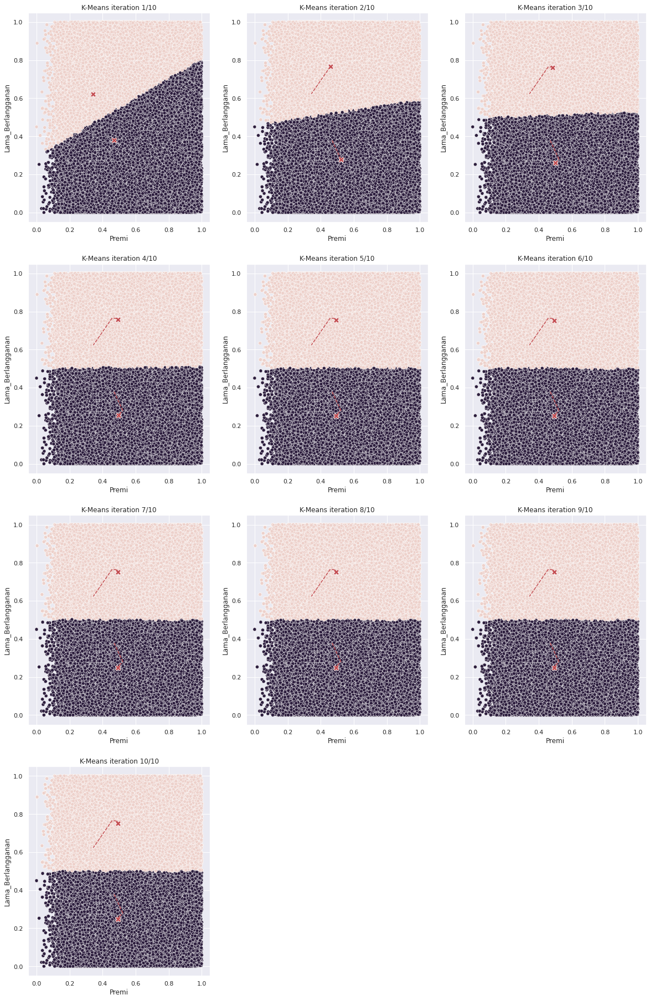

In [50]:
centroids_X1, idx_X1 = kmeans(X1, init_cetroid_X1, 10, True)

### Kmeans for X2 data : {Premi,Umur}

K-Means iteration 1/10 - norm difference - 0.0 - time required : 2.8155765533447266
K-Means iteration 2/10 - norm difference - 0.10626238121835807 - time required : 2.3112804889678955
K-Means iteration 3/10 - norm difference - 0.03714671895945598 - time required : 2.057109832763672
K-Means iteration 4/10 - norm difference - 0.01702846337570947 - time required : 1.7970616817474365
K-Means iteration 5/10 - norm difference - 0.007916060287573246 - time required : 1.5578958988189697
K-Means iteration 6/10 - norm difference - 0.004185075624930257 - time required : 1.3050460815429688
K-Means iteration 7/10 - norm difference - 0.0019383243469775768 - time required : 1.044823408126831
K-Means iteration 8/10 - norm difference - 0.0010351700563553806 - time required : 0.803318977355957
K-Means iteration 9/10 - norm difference - 0.000475618429100752 - time required : 0.5421535968780518
K-Means iteration 10/10 - norm difference - 0.00035500891400189194 - time required : 0.2840888500213623


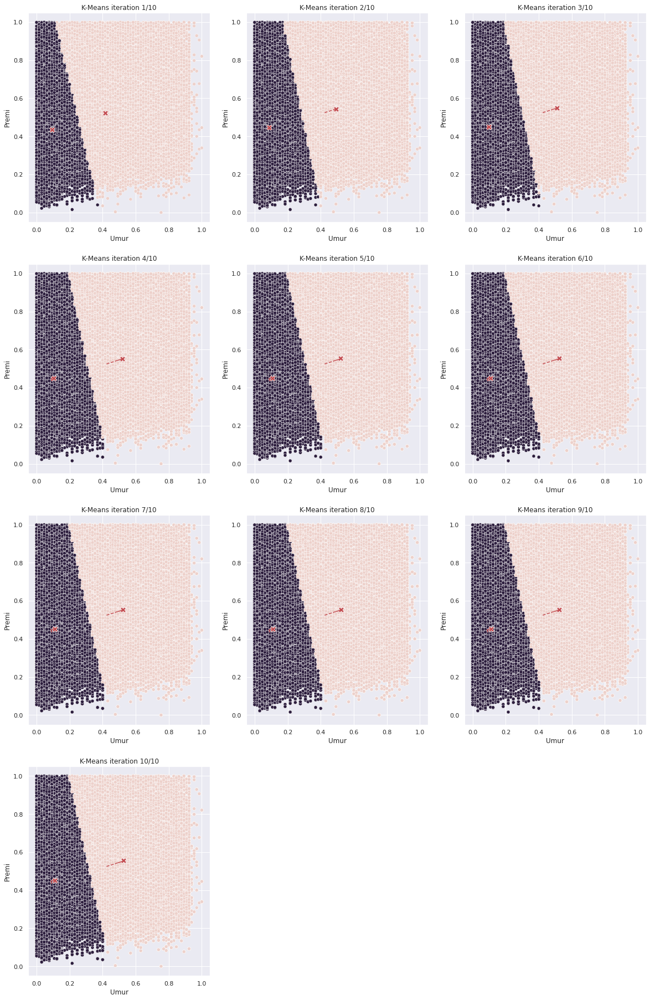

In [51]:
centroids_X2, idx_X2 = kmeans(X2, init_cetroid_X2, 10, True)

## Putting the clustered data in our dataframe

Now we will put the idx value of both clustered in our dataframe, by assigning Clustered_Xn as the name with n as which data it used to be clustred

In [52]:
clustered_data = pre_clean_encoded_data.copy()
clustered_data['Clustered_X1'] = idx_X1
clustered_data['Clustered_X2'] = idx_X2
clustered_data

,Jenis_Kelamin,Umur,SIM,Kode_Daerah,Sudah_Asuransi,Umur_Kendaraan,Kendaraan_Rusak,Premi,Kanal_Penjualan,Lama_Berlangganan,Tertarik,Clustered_X1,Clustered_X2
0,1,0.153846,1.0,33.0,1.0,0,0,0.358718,152.0,0.301038,0,2,2
1,0,0.430769,1.0,39.0,0.0,2,1,0.314001,29.0,0.512111,0,1,1
5,0,0.015385,1.0,35.0,1.0,0,0,0.252513,152.0,0.557093,0,1,2
8,1,0.000000,1.0,8.0,1.0,0,0,0.414027,160.0,0.072664,0,2,2
10,0,0.076923,1.0,14.0,1.0,0,0,0.482757,152.0,0.941176,0,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
285826,1,0.046154,1.0,4.0,1.0,0,0,0.317772,152.0,0.716263,0,1,2
285827,1,0.015385,1.0,46.0,1.0,0,0,0.692880,152.0,0.138408,0,2,2
285828,1,0.046154,1.0,50.0,1.0,0,0,0.794491,152.0,0.747405,0,1,2
285829,0,0.738462,1.0,7.0,1.0,1,0,0.408350,124.0,0.899654,0,1,1


# Evaluation and Experiment Using Elbow Method and SSE

## How many people are tertarik using our centroid with K=2

In [84]:
c11_t1 = clustered_data.loc[(clustered_data['Tertarik'] == 1) & (clustered_data['Clustered_X1'] == 1 )].shape[0]
c12_t1 = clustered_data.loc[(clustered_data['Tertarik'] == 1) & (clustered_data['Clustered_X1'] == 2 )].shape[0]
c11_t0 = clustered_data.loc[(clustered_data['Tertarik'] == 0) & (clustered_data['Clustered_X1'] == 1 )].shape[0]
c12_t0 = clustered_data.loc[(clustered_data['Tertarik'] == 0) & (clustered_data['Clustered_X1'] == 2 )].shape[0]

print('The total of people tertarik using X1 data on Centroid number 1 :', c11_t1)
print('The total of people not tertarik using X1 data on Centroid number 2 :', c12_t1)
print('The total of people tertarik using X1 data on Centroid number 1 :', c11_t0)
print('The total of people not tertarik using X1 data on Centroid number 2 :', c12_t0)

The total of people tertarik using X1 data on Centroid number 1 : 8096
The total of people not tertarik using X1 data on Centroid number 2 : 8100
The total of people tertarik using X1 data on Centroid number 1 : 59944
The total of people not tertarik using X1 data on Centroid number 2 : 60293


In [85]:
c21_t1 = clustered_data.loc[(clustered_data['Tertarik'] == 1) & (clustered_data['Clustered_X2'] == 1 )].shape[0]
c22_t1 = clustered_data.loc[(clustered_data['Tertarik'] == 1) & (clustered_data['Clustered_X2'] == 2 )].shape[0]
c21_t0 = clustered_data.loc[(clustered_data['Tertarik'] == 0) & (clustered_data['Clustered_X2'] == 1 )].shape[0]
c22_t0 = clustered_data.loc[(clustered_data['Tertarik'] == 0) & (clustered_data['Clustered_X2'] == 2 )].shape[0]

print('The total of people tertarik using X2 data on Centroid number 1 :', c21_t1)
print('The total of people not tertarik using X2 data on Centroid number 2 :', c22_t1)
print('The total of people tertarik using X2 data on Centroid number 1 :', c21_t0)
print('The total of people not tertarik using X2 data on Centroid number 2 :', c22_t0)

The total of people tertarik using X2 data on Centroid number 1 : 9619
The total of people not tertarik using X2 data on Centroid number 2 : 6577
The total of people tertarik using X2 data on Centroid number 1 : 45859
The total of people not tertarik using X2 data on Centroid number 2 : 74378


## SSE Function

In [53]:
def sse(x,c,idx):
  result = 0
  for i in range(c.shape[0]):
    result += np.abs(np.sum(c.iloc[i].to_numpy() - x.iloc[idx==i+1].to_numpy()))**2
  return result

In [54]:
sse_X1 = sse(X1,centroids_X1,idx_X1)
sse_X2 = sse(X2,centroids_X2,idx_X2)
print('Nilai SSE X1 :',sse_X1)
print('Nilai SSE X2 :',sse_X2)
print('Nilai SSE X1 (Scaled) :',sse_X1*(10**20))
print('Nilai SSE X2 (Scaled) :',sse_X2*(10**20))

Nilai SSE X1 : 5.653426027379092e-18
Nilai SSE X2 : 4.862617768733914e-17
Nilai SSE X1 (Scaled) : 565.3426027379091
Nilai SSE X2 (Scaled) : 4862.617768733914


## Using Elbow to know the best k value

### Create an empty list for SSE of data X1 and X1, aswell as a list of K from 1 to 12 in value

In [55]:
sse_list_X1 = []
sse_list_X2 = []
k_list = np.arange(1,13)
k_list

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

### Getting the SSE for all K

In [56]:
for k in k_list:
  start = time.time()
  centroids_X1, idx_X1 = kmeans(X1, init_random_centroids(X1,k), 10, False)
  sse_list_X1.append(sse(X1,centroids_X1,idx_X1))
  centroids_X2, idx_X2 = kmeans(X2, init_random_centroids(X2,k), 10, False)
  sse_list_X2.append(sse(X2,centroids_X2,idx_X2))
  stop = time.time()
  print(f'========================================== over all time for k={k} : {stop-start} s ==========================================')

K-Means iteration 1/10 - norm difference - 0.0 - time required : 0.03874921798706055
K-Means iteration 2/10 - norm difference - 0.2322432115127599 - time required : 0.02384805679321289
K-Means iteration 3/10 - norm difference - 0.0 - time required : 0.020947694778442383
K-Means iteration 4/10 - norm difference - 0.0 - time required : 0.021176815032958984
K-Means iteration 5/10 - norm difference - 0.0 - time required : 0.02445697784423828
K-Means iteration 6/10 - norm difference - 0.0 - time required : 0.018980979919433594
K-Means iteration 7/10 - norm difference - 0.0 - time required : 0.026281118392944336
K-Means iteration 8/10 - norm difference - 0.0 - time required : 0.021427392959594727
K-Means iteration 9/10 - norm difference - 0.0 - time required : 0.02106785774230957
K-Means iteration 10/10 - norm difference - 0.0 - time required : 0.0253448486328125
K-Means iteration 1/10 - norm difference - 0.0 - time required : 0.021650314331054688
K-Means iteration 2/10 - norm difference - 0

In [57]:
print(sse_X1)
print(sse_X2)

5.653426027379092e-18
4.862617768733914e-17


## Plotting Elbow Method

### Plot of X1 Data

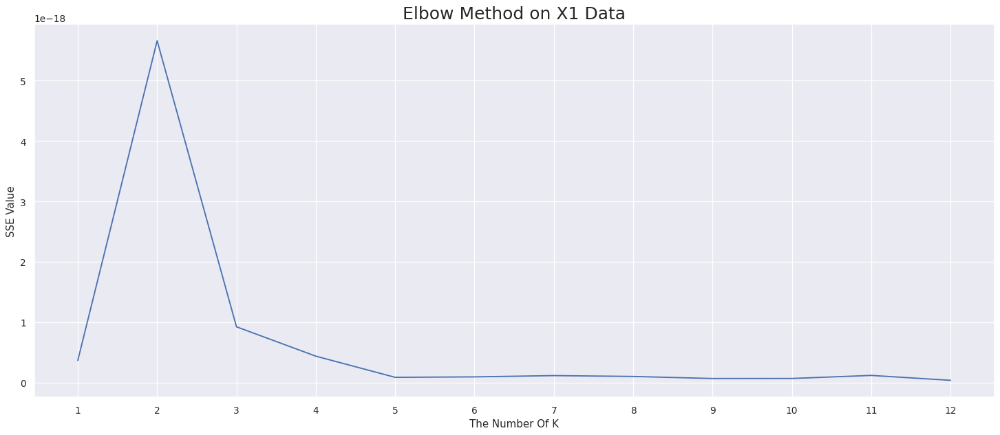

In [58]:
plt.figure(figsize=(20,8),dpi=90)
plt.title('Elbow Method on X1 Data',fontdict={'size':20})
sns.lineplot(x=k_list,y=sse_list_X1,markers=True)
plt.xlabel('The Number Of K')
plt.ylabel('SSE Value')
plt.xticks(k_list)
plt.show()

### Plot of X2 Data

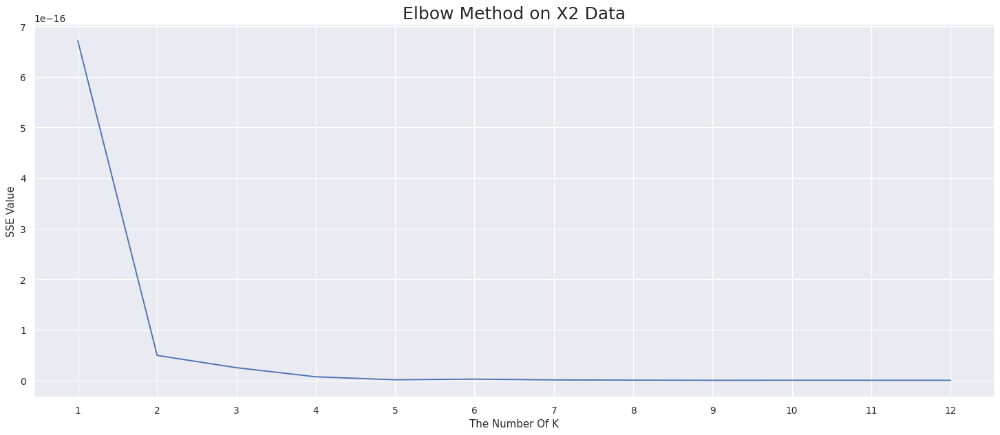

In [59]:
plt.figure(figsize=(20,8),dpi=90)
plt.title('Elbow Method on X2 Data',fontdict={'size':20})
sns.lineplot(x=k_list,y=sse_list_X2,markers=True)
plt.xlabel('The Number Of K')
plt.ylabel('SSE Value')
plt.xticks(k_list)
plt.show()

## X1 with K = 3


K-Means iteration 1/10 - norm difference - 0.0 - time required : 2.7149198055267334
K-Means iteration 2/10 - norm difference - 0.13072503192120638 - time required : 2.3372130393981934
K-Means iteration 3/10 - norm difference - 0.12194433610177205 - time required : 2.08158278465271
K-Means iteration 4/10 - norm difference - 0.08091463216378103 - time required : 1.8304722309112549
K-Means iteration 5/10 - norm difference - 0.050731060200474354 - time required : 1.5582163333892822
K-Means iteration 6/10 - norm difference - 0.03205471135280577 - time required : 1.3189826011657715
K-Means iteration 7/10 - norm difference - 0.020146791362756267 - time required : 1.0709879398345947
K-Means iteration 8/10 - norm difference - 0.01307503002280283 - time required : 0.8207635879516602
K-Means iteration 9/10 - norm difference - 0.008882003829076696 - time required : 0.5777630805969238
K-Means iteration 10/10 - norm difference - 0.006206629528234225 - time required : 0.297271728515625


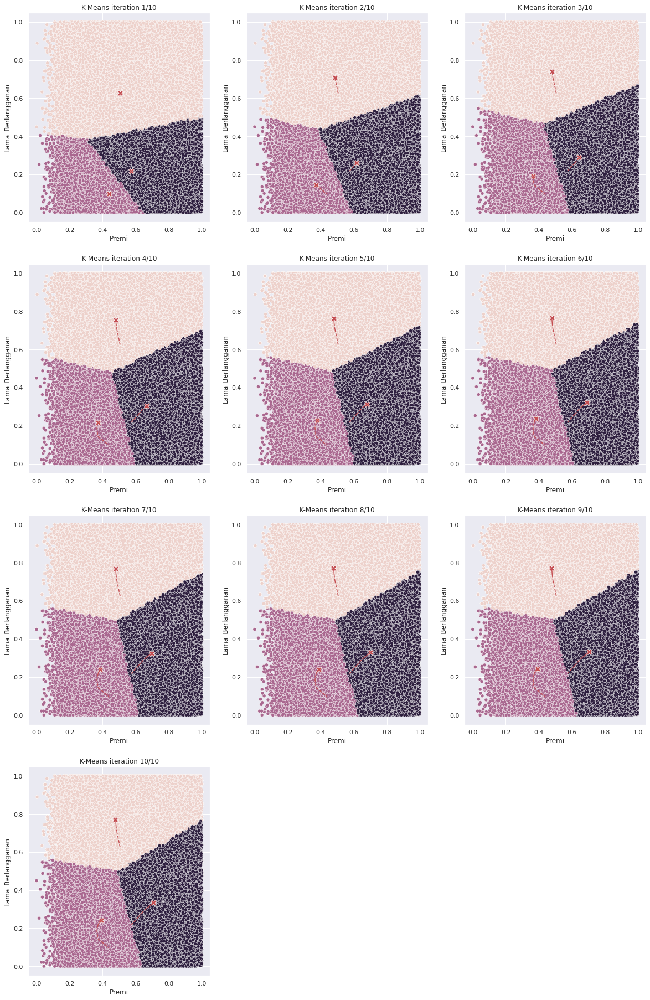

In [88]:
centroids_X1_new, idx_X1_new = kmeans(X1, init_random_centroids(X1,3), 10, True)

### The SSE score using k=3 on X1 data

In [90]:
sse_X1_new = sse(X1,centroids_X1_new,idx_X1_new)
print('Nilai SSE X1 with k=3 :',sse_X1_new)
print('Nilai SSE X1 with k=3 (Scaled) :',sse_X1_new*(10**18))

Nilai SSE X1 with k=3 : 3.590361522799006e-19
Nilai SSE X1 with k=3 (Scaled) : 0.3590361522799006


### Put it inside our dataframe

In [100]:
clustered_data['Clustered_X1_K3'] = idx_X1_new
clustered_data

,Jenis_Kelamin,Umur,SIM,Kode_Daerah,Sudah_Asuransi,Umur_Kendaraan,Kendaraan_Rusak,Premi,Kanal_Penjualan,Lama_Berlangganan,Tertarik,Clustered_X1,Clustered_X2,Clustered_X1_K3
0,1,0.153846,1.0,33.0,1.0,0,0,0.358718,152.0,0.301038,0,2,2,2
1,0,0.430769,1.0,39.0,0.0,2,1,0.314001,29.0,0.512111,0,1,1,2
5,0,0.015385,1.0,35.0,1.0,0,0,0.252513,152.0,0.557093,0,1,2,1
8,1,0.000000,1.0,8.0,1.0,0,0,0.414027,160.0,0.072664,0,2,2,2
10,0,0.076923,1.0,14.0,1.0,0,0,0.482757,152.0,0.941176,0,1,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
285826,1,0.046154,1.0,4.0,1.0,0,0,0.317772,152.0,0.716263,0,1,2,1
285827,1,0.015385,1.0,46.0,1.0,0,0,0.692880,152.0,0.138408,0,2,2,3
285828,1,0.046154,1.0,50.0,1.0,0,0,0.794491,152.0,0.747405,0,1,2,1
285829,0,0.738462,1.0,7.0,1.0,1,0,0.408350,124.0,0.899654,0,1,1,1


# Export the clustered Data

In [101]:
clustered_data.to_csv('Clustered_kendaraan_1301183430.csv')